<a href="https://colab.research.google.com/github/RohullahNajibi/rtu_detection/blob/main/DroneRTU4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# install dependencies: (use cu101 because colab has CUDA 10.1)
!pip install -U torch==1.5 torchvision==0.6 -f https://download.pytorch.org/whl/cu101/torch_stable.html 
!pip install cython pyyaml==5.1
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version

Looking in links: https://download.pytorch.org/whl/cu101/torch_stable.html
     |████████████████████████████████| 703.8MB 26kB/s 
     |████████████████████████████████| 6.6MB 35.7MB/s 
ERROR: torchtext 0.9.1 has requirement torch==1.8.1, but you'll have torch 1.5.0+cu101 which is incompatible.
  Found existing installation: torch 1.8.1+cu101
    Uninstalling torch-1.8.1+cu101:
      Successfully uninstalled torch-1.8.1+cu101
  Found existing installation: torchvision 0.9.1+cu101
    Uninstalling torchvision-0.9.1+cu101:
      Successfully uninstalled torchvision-0.9.1+cu101
     |████████████████████████████████| 276kB 7.4MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp37-cp37m-linux_x86_64.whl size=44091 sha256=43549ed2ae171399ed57b7310ac36aeb41e1ab5b9a2ddcb4428741d4a349744e
  Stored in directory: /root/.cache/pip/wheels/ad/56/bc/1522f864feb2a358ea6f1a92b4798d69ac783a28e80567a18b
Successfully built pyyaml
  Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.1

In [ ]:
# install detectron2:
!pip install detectron2==0.1.3 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html
     |████████████████████████████████| 6.2MB 6.8MB/s 
     |████████████████████████████████| 51kB 4.8MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.5.post20210604-cp37-none-any.whl size=60475 sha256=ffa52f42af625dfe7358ad5f8486192d681150f46e8062bf5980d5b5538332c0
  Stored in directory: /root/.cache/pip/wheels/74/e3/fb/2d4b0c12020f6e4535c2a8fb2da9b6b17cf9f03efd4e542ffc
Successfully built fvcore


In [ ]:
# You may need to restart your runtime prior to this, to let your installation take effect
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
import json
from detectron2.structures import BoxMode
def get_board_dicts(imgdir):
    json_file = imgdir+"/dataset.json"
    with open(json_file) as f:
        dataset_dicts = json.load(f)
    for i in dataset_dicts:
        filename = i["file_name"] 
        i["file_name"] = imgdir+"/"+filename 
        for j in i["annotations"]:
            j["bbox_mode"] = BoxMode.XYWH_ABS
            j["category_id"] = int(j["category_id"])
    return dataset_dicts
from detectron2.data import DatasetCatalog, MetadataCatalog
for d in ["train", "val"]:
    DatasetCatalog.register("RTU_" + d, lambda d=d: get_board_dicts("/content/gdrive/MyDrive/Augmented7_Drone_RTU_RCNN_A/" + d))
    MetadataCatalog.get("RTU_" + d).set(thing_classes=["RTU"])
board_metadata = MetadataCatalog.get("RTU_train")

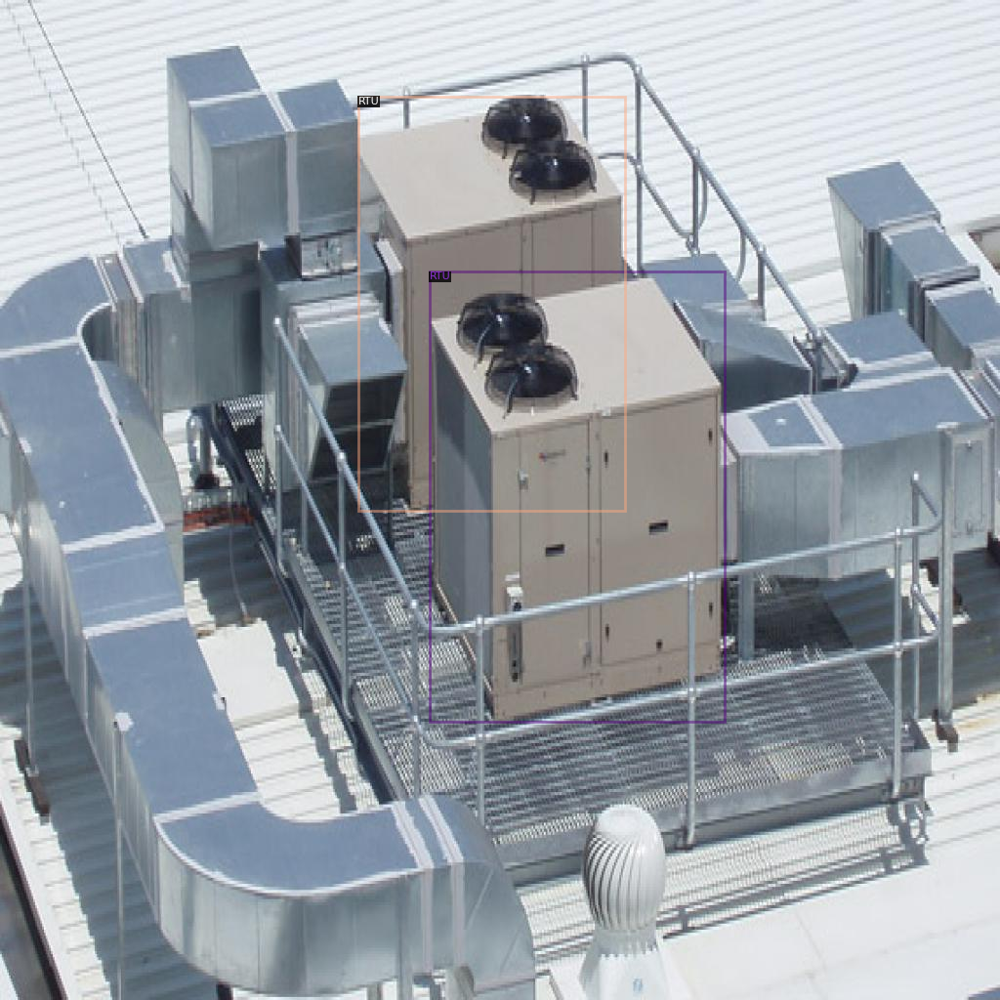

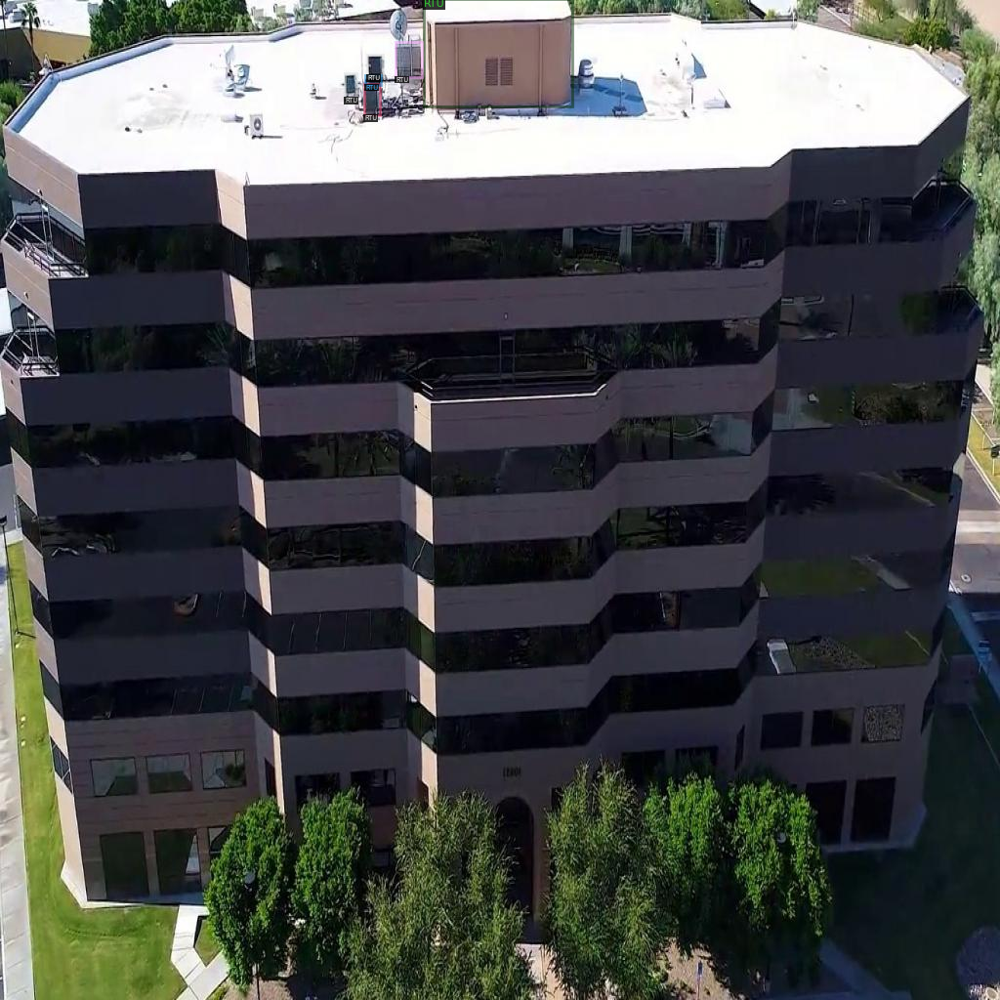

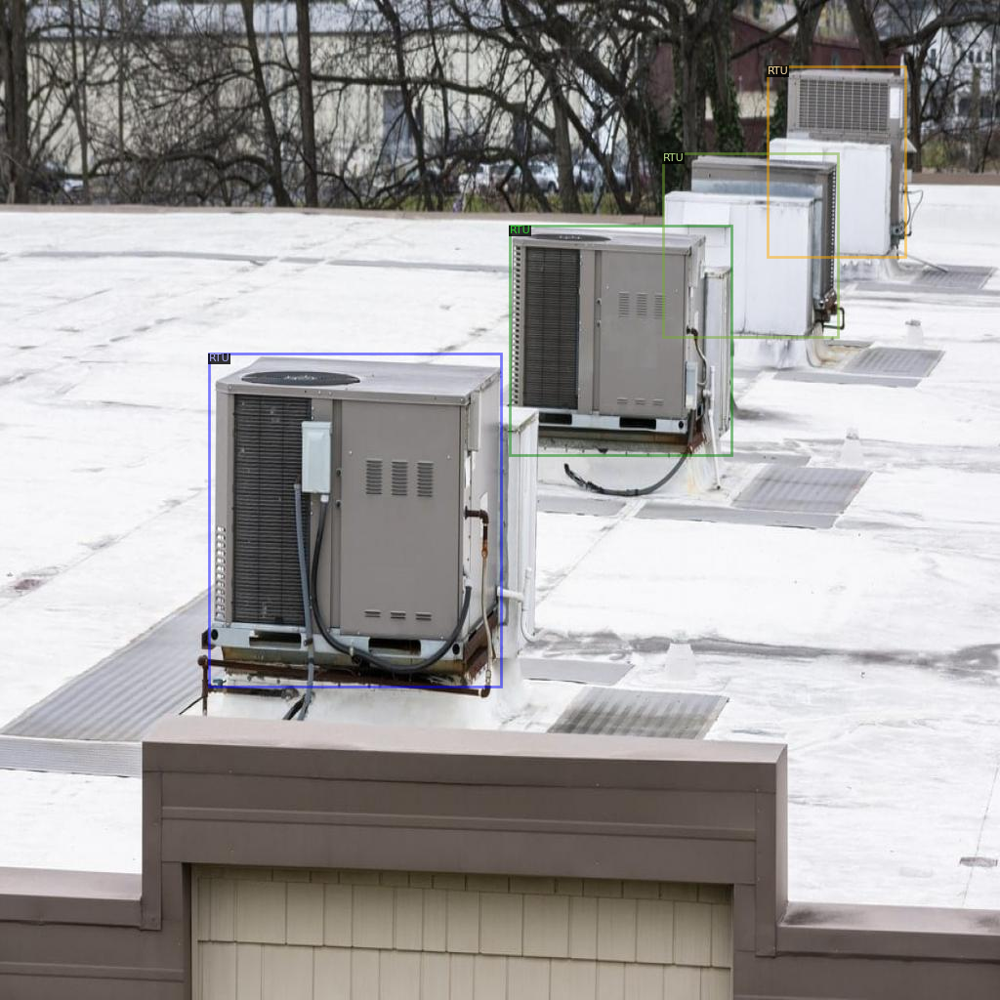

In [ ]:
dataset_dicts = get_board_dicts("/content/gdrive/MyDrive/Augmented7_Drone_RTU_RCNN_A/train/")
for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=board_metadata)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

In [ ]:
#We are importing our own Trainer Module here to use the COCO validation evaluation during training. Otherwise no validation eval occurs.

from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator

class CocoTrainer(DefaultTrainer):

  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):

    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"

    return COCOEvaluator(dataset_name, cfg, False, output_folder)

In [ ]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
import os
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("RTU_train",)
cfg.DATASETS.TEST = ("RTU_val",)
cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.0125  # pick a good LR
cfg.SOLVER.MAX_ITER = 700   
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 256  
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1 # No. of classes = [RTU]
cfg.TEST.EVAL_PERIOD = 700
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = CocoTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[06/08 23:15:16 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_280758.pkl: 167MB [00:02, 59.4MB/s]                           
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (2, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (2,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
roi_heads.box_pre

[06/08 23:15:20 d2.engine.train_loop]: Starting training from iteration 0
[06/08 23:15:29 d2.utils.events]:  eta: 0:04:31  iter: 19  total_loss: 1.026  loss_cls: 0.530  loss_box_reg: 0.321  loss_rpn_cls: 0.218  loss_rpn_loc: 0.078  time: 0.4038  data_time: 0.0462  lr: 0.000250  max_mem: 3159M
[06/08 23:15:37 d2.utils.events]:  eta: 0:04:17  iter: 39  total_loss: 0.968  loss_cls: 0.347  loss_box_reg: 0.386  loss_rpn_cls: 0.090  loss_rpn_loc: 0.075  time: 0.3949  data_time: 0.0108  lr: 0.000500  max_mem: 3159M
[06/08 23:15:44 d2.utils.events]:  eta: 0:04:07  iter: 59  total_loss: 0.871  loss_cls: 0.270  loss_box_reg: 0.446  loss_rpn_cls: 0.045  loss_rpn_loc: 0.069  time: 0.3901  data_time: 0.0082  lr: 0.000749  max_mem: 3159M
[06/08 23:15:52 d2.utils.events]:  eta: 0:03:59  iter: 79  total_loss: 0.753  loss_cls: 0.216  loss_box_reg: 0.468  loss_rpn_cls: 0.030  loss_rpn_loc: 0.035  time: 0.3894  data_time: 0.0107  lr: 0.000999  max_mem: 3159M
[06/08 23:16:00 d2.utils.events]:  eta: 0:03:5

In [ ]:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.8  # set the testing threshold for this model
cfg.DATASETS.TEST = ("RTU_val", )
predictor = DefaultPredictor(cfg)

In [ ]:
from detectron2.utils.visualizer import ColorMode
dataset_dicts = get_board_dicts("/content/gdrive/MyDrive/Augmented7_Drone_RTU_RCNN_A/val")
for d in random.sample(dataset_dicts, 5):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=board_metadata, 
                   scale=0.8,
                   instance_mode=ColorMode.IMAGE   # remove the colors of unsegmented pixels
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(v.get_image()[:, :, ::-1])

In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("RTU_val", cfg, False, output_dir="/output/")
val_loader = build_detection_test_loader(cfg, "RTU_val")
inference_on_dataset(predictor.model, val_loader, evaluator)
# another equivalent way is to use trainer.test

[06/08 23:21:43 d2.data.common]: Serializing 9 elements to byte tensors and concatenating them all ...
[06/08 23:21:43 d2.data.common]: Serialized dataset takes 0.00 MiB
[06/08 23:21:43 d2.evaluation.evaluator]: Start inference on 9 images
[06/08 23:21:45 d2.evaluation.evaluator]: Total inference time: 0:00:00.375471 (0.093868 s / img per device, on 1 devices)
[06/08 23:21:45 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:00 (0.054427 s / img per device, on 1 devices)
[06/08 23:21:45 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[06/08 23:21:45 d2.evaluation.coco_evaluation]: Saving results to /output/coco_instances_results.json
[06/08 23:21:45 d2.evaluation.coco_evaluation]: Evaluating predictions ...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.01s).
Accumulating evaluation results...
DONE (t=0.00s).
 Average Precision  (AP) @[ IoU=0

OrderedDict([('bbox',
              {'AP': 1.6633663366336637,
               'AP50': 2.3762376237623766,
               'AP75': 2.3762376237623766,
               'APl': 5.891089108910891,
               'APm': 0.0,
               'APs': nan})])